# YOLO

## Installazione librerie

In [ ]:
!pip install ultralytics

## Riconoscere un immagine con YOLO


image 1/1 /content/IMG_6279.jpg: 384x640 1 person, 1 tv, 25.7ms
Speed: 4.7ms preprocess, 25.7ms inference, 2.8ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict10
Numero di oggetti rilevati: 2



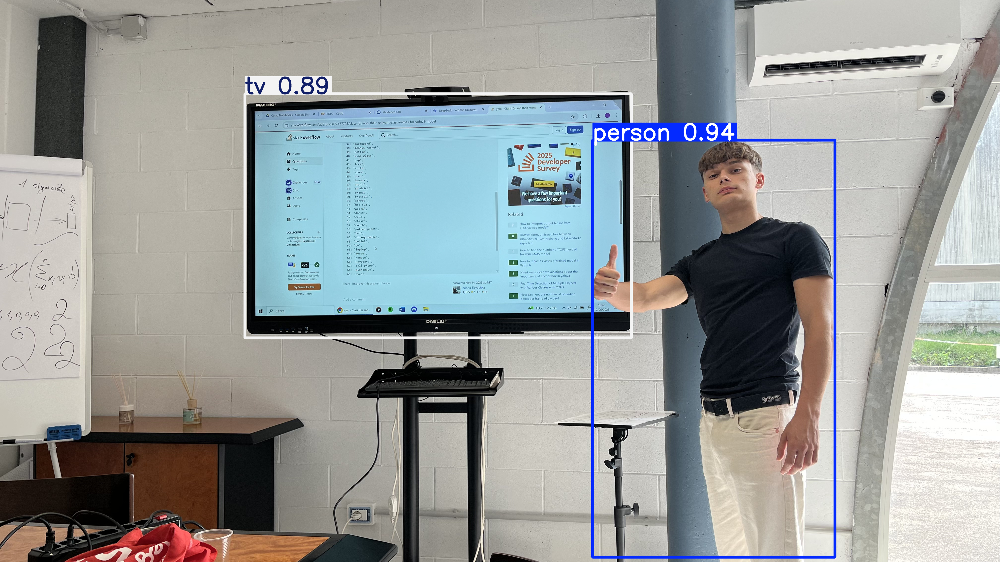

In [ ]:
from ultralytics import YOLO
model = YOLO("yolov8n.pt")  # Carica il modello preaddestrato

results = model.predict("IMG_6279.jpg", conf=0.7, save=True, classes = [0,62])

print(f"Numero di oggetti rilevati: {len(results[0].boxes)}\n")

results[0].show()

## Riconoscere un video con YOLO
### Il video con il tracking è salvato in locale

In [ ]:
from ultralytics import YOLO
import time

def process_video(video_path, conf_threshold=0.7):
    # Caricamento modello
    model = YOLO("yolov8n.pt")

    results = model.predict(
        source=video_path,
        conf=conf_threshold,
        save=True,
        save_txt=True,
        stream=True  # Modalità streaming per video
    )

    # Statistiche
    total_frames = 0
    total_objects = 0
    class_counts = {}

    # Processa ogni frame
    for frame_idx, result in enumerate(results):
        total_frames += 1
        current_objects = len(result.boxes)
        total_objects += current_objects

        # Aggiorna conteggio classi
        for box in result.boxes:
            class_name = result.names[int(box.cls)]
            class_counts[class_name] = class_counts.get(class_name, 0) + 1

        # Feedback ogni 10 frame
        if frame_idx % 10 == 0:
            print(f"📊 Frame {frame_idx}: {current_objects} oggetti rilevati")

if __name__ == "__main__":
    video_file = "IMG_6280.mp4"  # Sostituisci con il tuo percorso
    process_video(video_file, conf_threshold=0.7)

## Riconoscere un video con YOLO
### Il video con il tracking è mostrato in tempo reale

In [ ]:
from ultralytics import YOLO
import cv2
from google.colab.patches import cv2_imshow
from IPython.display import clear_output
import time

video_file = "Slow Motion Dog Run.mp4"

# Caricamento modello
model = YOLO("yolov8n.pt")

# Inizializza il video capture
cap = cv2.VideoCapture(video_file)

# Statistiche
total_frames = 0
total_objects = 0
class_counts = {}
frame_skip = 2  # Elabora 1 frame ogni N (riduce il carico)

while cap.isOpened():
    success, frame = cap.read()
    if not success:
        break

    total_frames += 1

    # Processa solo 1 frame ogni 'frame_skip'
    if total_frames % frame_skip != 0:
        continue

    # Esegue il tracking
    results = model.track(
        frame,
        persist=True,  # Mantiene l'ID tra i frame
        conf=0.5,
        verbose=False  # Disabilita i log
    )

    # Visualizza i risultati
    annotated_frame = results[0].plot()

    # Mostra il frame in tempo reale
    cv2_imshow(annotated_frame)
    clear_output(wait=True)  # Sostituisce il frame precedente

    # Aggiorna le statistiche
    current_objects = len(results[0].boxes)
    total_objects += current_objects

    for box in results[0].boxes:
        class_id = int(box.cls)
        class_name = results[0].names[class_id]
        class_counts[class_name] = class_counts.get(class_name, 0) + 1

    # Interrompi con 'q'
    if cv2.waitKey(1) & 0xFF == ord("q"):
        break

cap.release()
print("Elaborazione completata!")
print(f"Totale frame elaborati: {total_frames}")
print(f"Totale oggetti rilevati: {total_objects}")
print("Conteggio per classe:")
for class_name, count in class_counts.items():
    print(f"{class_name}: {count}")